<a href="https://colab.research.google.com/github/rachmazamalia/MyBeans/blob/main/cnn_fix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
import os
import cv2
import shutil
import random
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras.preprocessing.image
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense, Flatten, BatchNormalization, LeakyReLU, GlobalAveragePooling2D, Conv2D, MaxPool2D, MaxPooling2D
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from google.colab import drive
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam, Nadam, RMSprop
from sklearn.preprocessing import LabelEncoder

In [31]:
# Mount Google Drive
from google.colab import drive
drive.mount("/content/drive")

# Set the path to the dataset
dataset_path = "/content/drive/MyDrive/dataset/bijikopi"
os.listdir(dataset_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


['Grade2', 'Grade3', 'Grade1']

In [32]:
print('Grade 1 :',len(os.listdir("/content/drive/MyDrive/dataset/bijikopi/Grade1")))
print('Grade 2 :',len(os.listdir("/content/drive/MyDrive/dataset/bijikopi/Grade2")))
print('Grade 3 :',len(os.listdir("/content/drive/MyDrive/dataset/bijikopi/Grade3")))

Grade 1 : 204
Grade 2 : 211
Grade 3 : 210


In [33]:
# Load the dataset
data = []
labels = []

# Iterate through the dataset path and load the images
for category in os.listdir(dataset_path):
    category_path = os.path.join(dataset_path, category)
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (150, 150))
        data.append(image)
        labels.append(category)

# Convert data and labels to numpy arrays
data = np.array(data)
labels = np.array(labels)

In [34]:
# Perform label encoding
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

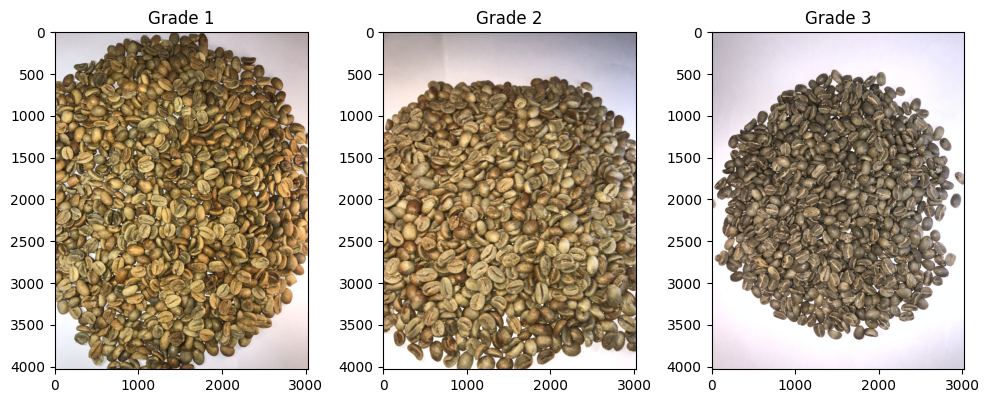

In [35]:
# Get a list of images in each grade folder
grade1_images = os.listdir(os.path.join(dataset_path, "Grade1"))
grade2_images = os.listdir(os.path.join(dataset_path, "Grade2"))
grade3_images = os.listdir(os.path.join(dataset_path, "Grade3"))

# Choose a random sample from each grade
sample_grade1 = random.choice(grade1_images)
sample_grade2 = random.choice(grade2_images)
sample_grade3 = random.choice(grade3_images)

# Load and display the sample images
sample1_path = os.path.join(dataset_path, "Grade1", sample_grade1)
sample2_path = os.path.join(dataset_path, "Grade2", sample_grade2)
sample3_path = os.path.join(dataset_path, "Grade3", sample_grade3)

sample1_img = cv2.imread(sample1_path)
sample2_img = cv2.imread(sample2_path)
sample3_img = cv2.imread(sample3_path)

# Convert BGR to RGB
sample1_img = cv2.cvtColor(sample1_img, cv2.COLOR_BGR2RGB)
sample2_img = cv2.cvtColor(sample2_img, cv2.COLOR_BGR2RGB)
sample3_img = cv2.cvtColor(sample3_img, cv2.COLOR_BGR2RGB)

# Plot the images
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.imshow(sample1_img)
plt.title("Grade 1")

plt.subplot(1, 3, 2)
plt.imshow(sample2_img)
plt.title("Grade 2")

plt.subplot(1, 3, 3)
plt.imshow(sample3_img)
plt.title("Grade 3")

plt.tight_layout()
plt.show()

In [63]:
# Perform data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,  # Random rotation
    width_shift_range=0.1,  # Random horizontal shift
    height_shift_range=0.1,  # Random vertical shift
    shear_range=0.1,  # Shear transformation
    zoom_range=0.1,  # Random zoom
    horizontal_flip=True,  # Random horizontal flip
    validation_split=0.1  # Splitting the dataset into train and validation sets
)

In [64]:
# Split the dataset into train and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(
    data, labels, test_size=0.2, stratify=labels, random_state=42
)

In [65]:
# Apply data augmentation to the training set
train_generator = datagen.flow(train_data, train_labels, batch_size=32, subset='training')

# Apply data augmentation to the validation set
val_generator = datagen.flow(val_data, val_labels, batch_size=32, subset='validation')

In [66]:
# Get the class names
class_names = label_encoder.classes_

# Display the class names
print("Class Names:", class_names)

Class Names: ['Grade1' 'Grade2' 'Grade3']


In [67]:
# Split the validation set into validation and test sets
val_data, test_data, val_labels, test_labels = train_test_split(
    val_data, val_labels, test_size=0.25, stratify=val_labels, random_state=42
)

In [68]:
# Normalize the image data
train_data = train_data.astype('float32') / 255.0
val_data = val_data.astype('float32') / 255.0
test_data = test_data.astype('float32') / 255.0

# Print the shape of each dataset
print("Train data shape:", train_data.shape)
print("Validation data shape:", val_data.shape)
print("Test data shape:", test_data.shape)
print("Train labels shape:", train_labels.shape)
print("Validation labels shape:", val_labels.shape)
print("Test labels shape:", test_labels.shape)

Train data shape: (500, 150, 150, 3)
Validation data shape: (93, 150, 150, 3)
Test data shape: (32, 150, 150, 3)
Train labels shape: (500,)
Validation labels shape: (93,)
Test labels shape: (32,)


In [69]:
print('Train :', len(train_data))
print('Validation :', len(val_data))
print('Test :', len(test_data))

Train : 500
Validation : 93
Test : 32


In [76]:
# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),
    #Conv2D(128, (3, 3), activation='relu'),
    #MaxPool2D((2, 2)),
    #Conv2D(128, (3, 3), activation='relu'),
    #MaxPool2D((2, 2)),
    Flatten(),
    #Dense(128, activation='relu'),
    #Dropout(0.5),
    Dense(3, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Set the early stopping callback
early_stopping = EarlyStopping(patience=5, restore_best_weights=True)

# Train the model
history = model.fit(train_generator, 
                    validation_data=val_generator,
                    verbose = 1,
                    epochs=20)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data, test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/20
15/15 [==============================] - 20s 1s/step - loss: 92.1106 - accuracy: 0.3689 - val_loss: 29.2476 - val_accuracy: 0.4167
Epoch 2/20
15/15 [==============================] - 18s 1s/step - loss: 37.5402 - accuracy: 0.4111 - val_loss: 6.5671 - val_accuracy: 0.5000
Epoch 3/20
15/15 [==============================] - 18s 1s/step - loss: 6.6316 - accuracy: 0.5778 - val_loss: 4.4087 - val_accuracy: 0.7500
Epoch 4/20
15/15 [==============================] - 18s 1s/step - loss: 2.9788 - accuracy: 0.7489 - val_loss: 0.0854 - val_accuracy: 1.0000
Epoch 5/20
15/15 [==============================] - 20s 1s/step - loss: 1.4405 - accuracy: 0.8378 - val_loss: 0.8551 - val_accuracy: 0.8333
Epoch 6/20
15/15 [==============================] - 18s 1s/step - loss: 1.0946 - accuracy: 0.8467 - val_loss: 1.7974 - val_accuracy: 0.7500
Epoch 7/20
15/15 [==============================] - 18s 1s/step - loss: 1.0751 - accuracy: 0.8600 - val_loss: 0.9198 - val_accuracy: 0.9167
Epoch 8/20
15/15 

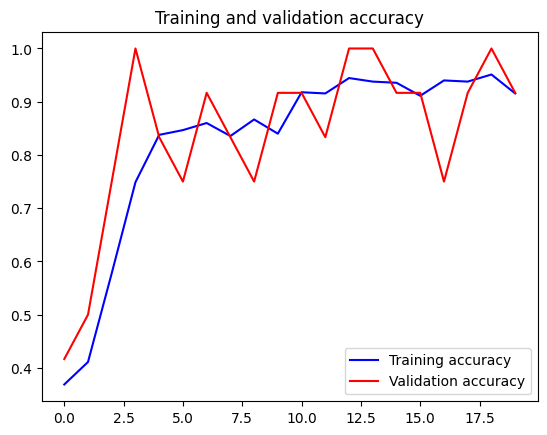

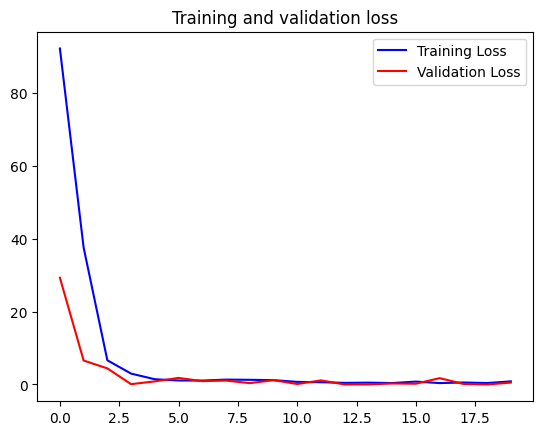

In [77]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

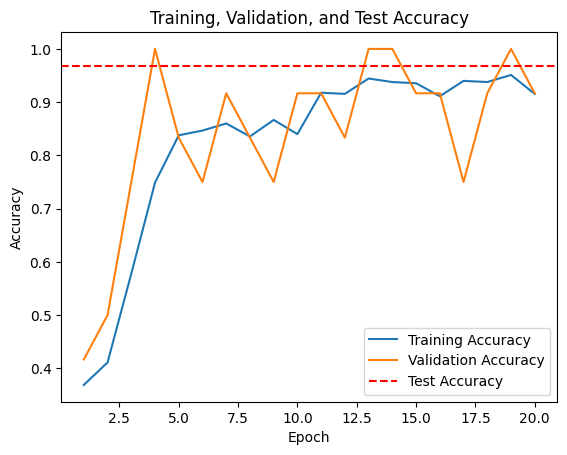

In [83]:
# Get the training and validation accuracy from the history object
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot the accuracy curves
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.axhline(test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training, Validation, and Test Accuracy')
plt.legend()
plt.show()

In [119]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data, test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Get the train accuracy
train_loss, train_accuracy = model.evaluate(train_data, train_labels)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

# Get the val accuracy
val_loss, val_accuracy = model.evaluate(val_data, val_labels)
print("Val Loss:", val_loss)
print("Val Accuracy:", val_accuracy)


1/1 [==============================] - 1s 1s/step - loss: 0.9613 - accuracy: 0.9688
Test Loss: 0.961333155632019
Test Accuracy: 0.96875
16/16 [==============================] - 5s 279ms/step - loss: 0.9611 - accuracy: 0.9620
Train Loss: 0.9610578417778015
Train Accuracy: 0.9620000123977661
3/3 [==============================] - 1s 254ms/step - loss: 0.9590 - accuracy: 0.9785
Val Loss: 0.9589956402778625
Val Accuracy: 0.9784946441650391


In [79]:
model.save('modelv2.h5')
model.save('modelv2')
!zip -r 'modelv2.zip' 'modelv2'

updating: modelv2/ (stored 0%)
updating: modelv2/variables/ (stored 0%)
updating: modelv2/variables/variables.index (deflated 60%)
updating: modelv2/variables/variables.data-00000-of-00001 (deflated 11%)
updating: modelv2/saved_model.pb (deflated 88%)
updating: modelv2/assets/ (stored 0%)
updating: modelv2/keras_metadata.pb (deflated 89%)
updating: modelv2/fingerprint.pb (stored 0%)


In [80]:
import pathlib

converter = tf.lite.TFLiteConverter.from_saved_model('modelv2')

# Set the optimizations
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS]

tflite_model = converter.convert()

tflite_model_file = pathlib.Path('./modelv2.tflite')
tflite_model_file.write_bytes(tflite_model)

275080

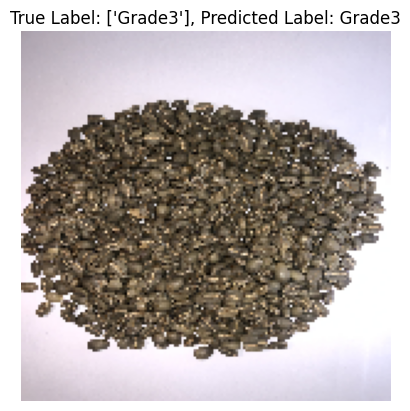

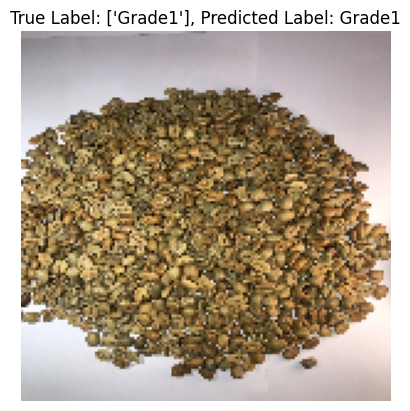

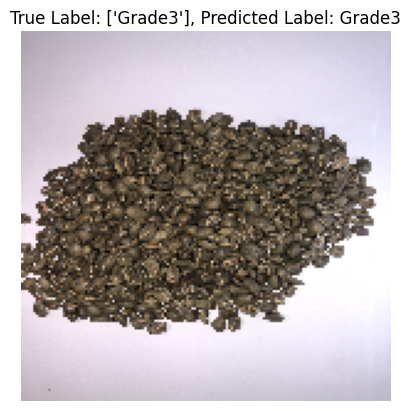

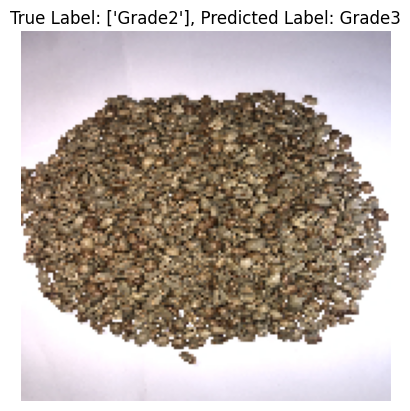

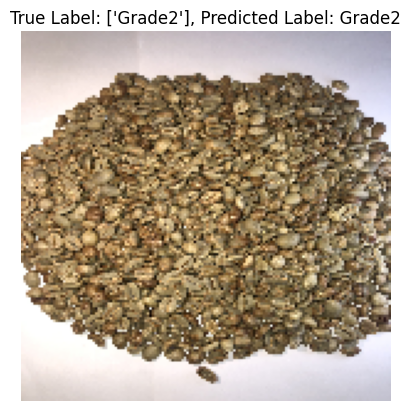

...

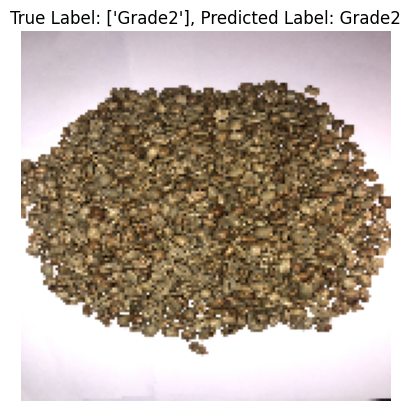

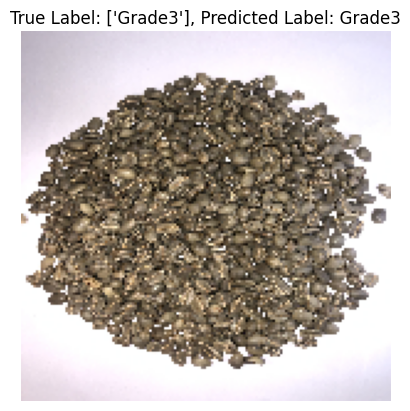

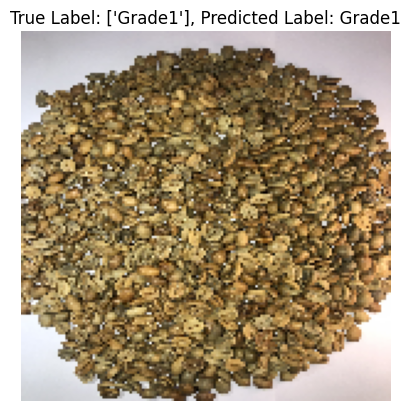

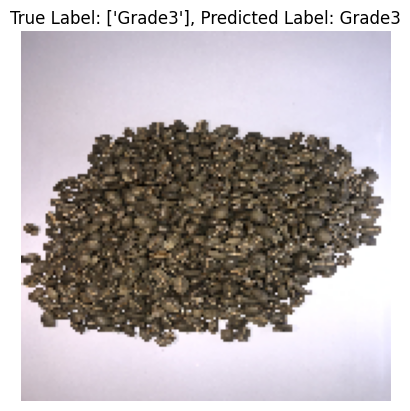

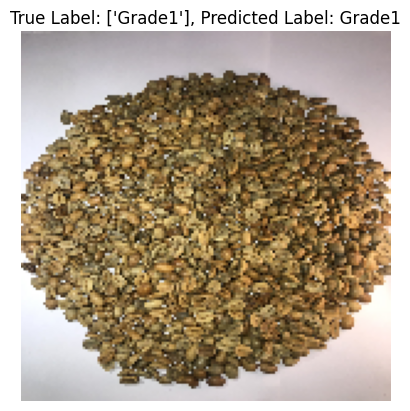

In [88]:
# Display the images from the test data with predicted labels
for i in range(len(test_labels)):
    image = test_data[i]
    true_label = label_encoder.inverse_transform([test_labels[i]])
    predicted_label = predicted_classes[i]

    # Convert image from normalization back to original scale
    image = image * 255.0

    # Convert image to unsigned 8-bit integers
    image = image.astype(np.uint8)

    # Display the image and predicted label
    plt.imshow(image)
    plt.title(f"True Label: {true_label}, Predicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()


In [87]:
# Make predictions on the test data
test_predictions = model.predict(test_data)

# Convert the predicted probabilities to class labels
predicted_labels = np.argmax(test_predictions, axis=1)

# Decode the predicted labels using the label encoder
predicted_classes = label_encoder.inverse_transform(predicted_labels)

# Compare the predicted classes with the true classes
for i in range(len(test_labels)):
    print("True Label: ", label_encoder.inverse_transform([test_labels[i]]))
    print("Predicted Label: ", predicted_classes[i])
    print("------------------------------------")

1/1 [==============================] - 0s 338ms/step
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
T

**MOBILENET**

In [91]:
from tensorflow.keras.applications import MobileNetV2

# Load the MobileNetV2 model without the top classifier
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False

# Create a new model on top of the base model
mobilenet_model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(3, activation='softmax')
])

# Compile the model
mobilenet_model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [98]:
# Train the model
history_v2 = mobilenet_model.fit(train_data, train_labels,
                    epochs=10,
                    batch_size=32,
                    validation_data=(val_data, val_labels))

Epoch 1/10
16/16 [==============================] - 11s 723ms/step - loss: 0.0212 - accuracy: 0.9980 - val_loss: 0.0111 - val_accuracy: 1.0000
Epoch 2/10
16/16 [==============================] - 11s 711ms/step - loss: 0.0202 - accuracy: 1.0000 - val_loss: 0.0103 - val_accuracy: 1.0000
Epoch 3/10
16/16 [==============================] - 13s 846ms/step - loss: 0.0165 - accuracy: 1.0000 - val_loss: 0.0091 - val_accuracy: 1.0000
Epoch 4/10
16/16 [==============================] - 10s 629ms/step - loss: 0.0129 - accuracy: 1.0000 - val_loss: 0.0085 - val_accuracy: 1.0000
Epoch 5/10
16/16 [==============================] - 17s 1s/step - loss: 0.0147 - accuracy: 1.0000 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 6/10
16/16 [==============================] - 10s 654ms/step - loss: 0.0133 - accuracy: 0.9980 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 7/10
16/16 [==============================] - 15s 874ms/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 0.0070 - val_accuracy: 1.0000
Ep

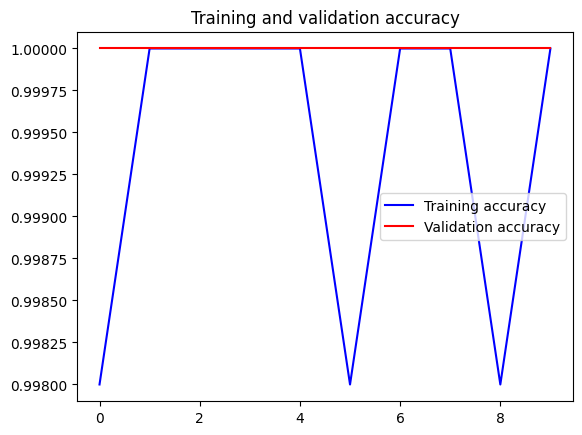

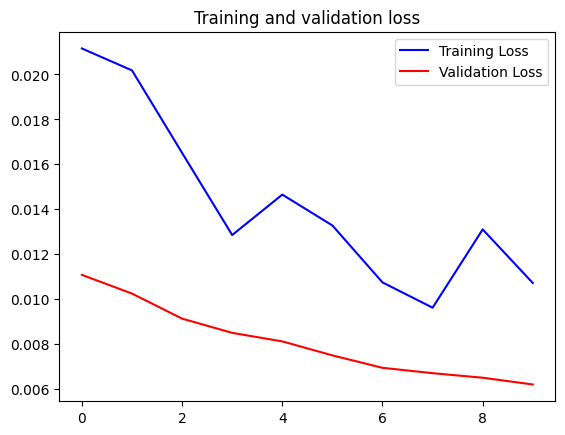

In [99]:
import matplotlib.pyplot as plt

acc = history_v2.history['accuracy']
val_acc = history_v2.history['val_accuracy']
loss = history_v2.history['loss']
val_loss = history_v2.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

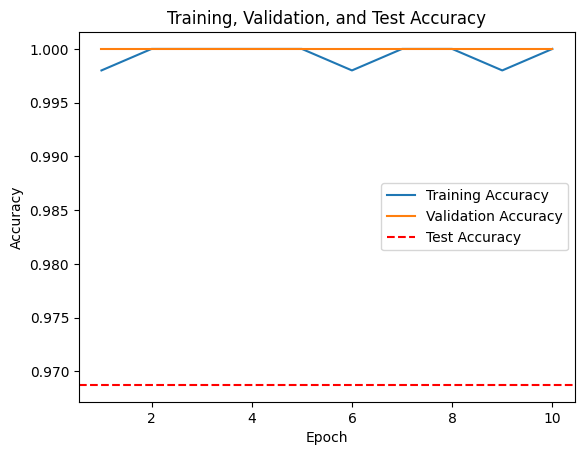

In [100]:
# Get the training and validation accuracy from the history object
train_accuracy = history_v2.history['accuracy']
val_accuracy = history_v2.history['val_accuracy']

# Plot the accuracy curves
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.axhline(test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training, Validation, and Test Accuracy')
plt.legend()
plt.show()

In [118]:
# Evaluate the model on the test set
test_loss, test_accuracy = mobilenet_model.evaluate(test_data, test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Get the train accuracy
train_loss, train_accuracy = mobilenet_model.evaluate(train_data, train_labels)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

# Get the val accuracy
val_loss, val_accuracy = mobilenet_model.evaluate(val_data, val_labels)
print("Val Loss:", val_loss)
print("Val Accuracy:", val_accuracy)

1/1 [==============================] - 1s 563ms/step - loss: 0.0168 - accuracy: 1.0000
Test Loss: 0.016764793545007706
Test Accuracy: 1.0
16/16 [==============================] - 10s 601ms/step - loss: 0.0062 - accuracy: 1.0000
Train Loss: 0.006246752571314573
Train Accuracy: 1.0
3/3 [==============================] - 1s 421ms/step - loss: 0.0062 - accuracy: 1.0000
Val Loss: 0.006212898064404726
Val Accuracy: 1.0


In [102]:
mobilenet_model.save('mobilenet_model.h5')
mobilenet_model.save('mobilenet_model')
!zip -r 'mobilenet_model.zip' 'mobilenet_model'

  adding: mobilenet_model/ (stored 0%)
  adding: mobilenet_model/variables/ (stored 0%)
  adding: mobilenet_model/variables/variables.index (deflated 76%)
  adding: mobilenet_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: mobilenet_model/saved_model.pb (deflated 91%)
  adding: mobilenet_model/assets/ (stored 0%)
  adding: mobilenet_model/keras_metadata.pb (deflated 96%)
  adding: mobilenet_model/fingerprint.pb (stored 0%)


In [103]:
import pathlib

converter = tf.lite.TFLiteConverter.from_saved_model('mobilenet_model')

# Set the optimizations
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS]

tflite_model = converter.convert()

tflite_model_file = pathlib.Path('./mobilenet_model.tflite')
tflite_model_file.write_bytes(tflite_model)

2675576

In [104]:
# Make predictions on the test data
test_predictions = mobilenet_model.predict(test_data)

# Convert the predicted probabilities to class labels
predicted_labels = np.argmax(test_predictions, axis=1)

# Decode the predicted labels using the label encoder
predicted_classes = label_encoder.inverse_transform(predicted_labels)

# Compare the predicted classes with the true classes
for i in range(len(test_labels)):
    print("True Label: ", label_encoder.inverse_transform([test_labels[i]]))
    print("Predicted Label: ", predicted_classes[i])
    print("------------------------------------")

1/1 [==============================] - 2s 2s/step
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True

**RESTNET**

In [106]:
import tensorflow_hub as hub
import tensorflow as tf
restnet_v1 = "https://tfhub.dev/google/imagenet/resnet_v1_50/classification/5"
restnet_v1_layers = hub.KerasLayer(restnet_v1, input_shape=(150,150,3))
restnet_v1_layers.trainable = False

restnet_v1_model = tf.keras.Sequential([
    restnet_v1_layers,
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(256,activation='relu'),
    tf.keras.layers.Dense(128,activation='relu'),
    # tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dense(3,activation='softmax')
])

In [108]:
restnet_v1_model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [109]:
hist = restnet_v1_model.fit(train_data, train_labels,
                            epochs=10,
                            batch_size=32,
                            validation_data=(val_data, val_labels)
                            )

Epoch 1/10
16/16 [==============================] - 48s 3s/step - loss: 1.1591 - accuracy: 0.5700 - val_loss: 0.2685 - val_accuracy: 0.9247
Epoch 2/10
16/16 [==============================] - 41s 3s/step - loss: 0.3496 - accuracy: 0.8740 - val_loss: 0.1244 - val_accuracy: 0.9785
Epoch 3/10
16/16 [==============================] - 47s 3s/step - loss: 0.1954 - accuracy: 0.9300 - val_loss: 0.0735 - val_accuracy: 0.9785
Epoch 4/10
16/16 [==============================] - 52s 3s/step - loss: 0.1269 - accuracy: 0.9560 - val_loss: 0.0629 - val_accuracy: 0.9892
Epoch 5/10
16/16 [==============================] - 49s 3s/step - loss: 0.1027 - accuracy: 0.9680 - val_loss: 0.0494 - val_accuracy: 0.9892
Epoch 6/10
16/16 [==============================] - 60s 4s/step - loss: 0.0916 - accuracy: 0.9700 - val_loss: 0.0539 - val_accuracy: 0.9892
Epoch 7/10
16/16 [==============================] - 50s 3s/step - loss: 0.0869 - accuracy: 0.9680 - val_loss: 0.0433 - val_accuracy: 0.9785
Epoch 8/10
16/16 [==

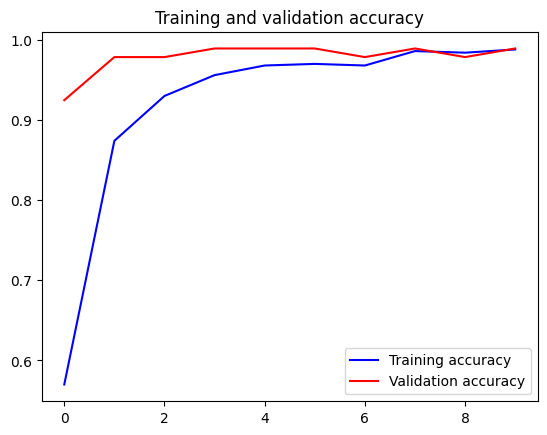

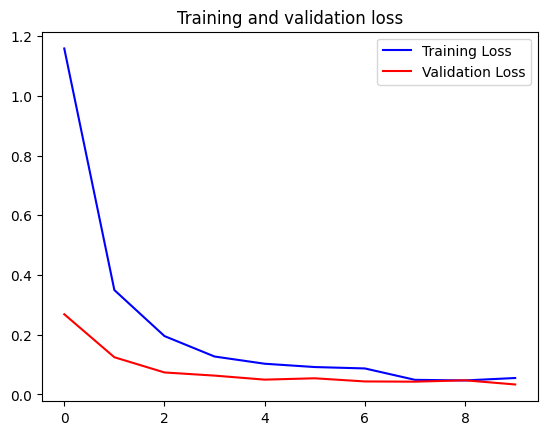

In [111]:
import matplotlib.pyplot as plt

acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

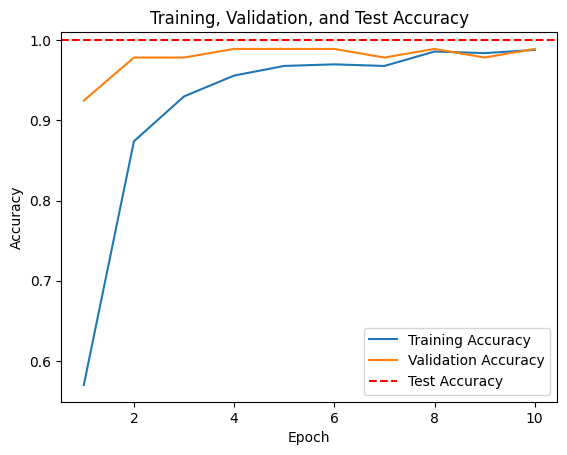

In [112]:
# Get the training and validation accuracy from the history object
train_accuracy = hist.history['accuracy']
val_accuracy = hist.history['val_accuracy']

# Plot the accuracy curves
plt.plot(range(1, len(train_accuracy) + 1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, len(val_accuracy) + 1), val_accuracy, label='Validation Accuracy')
plt.axhline(test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training, Validation, and Test Accuracy')
plt.legend()
plt.show()

In [114]:
# Evaluate the model on the test set
test_loss, test_accuracy = restnet_v1_model.evaluate(test_data, test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Get the train accuracy
train_loss, train_accuracy = restnet_v1_model.evaluate(train_data, train_labels)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

# Get the val accuracy
val_loss, val_accuracy = restnet_v1_model.evaluate(val_data, val_labels)
print("Val Loss:", val_loss)
print("Val Accuracy:", val_accuracy)

1/1 [==============================] - 3s 3s/step - loss: 0.0105 - accuracy: 1.0000
Test Loss: 0.010470645502209663
Test Accuracy: 1.0
16/16 [==============================] - 32s 2s/step - loss: 0.0143 - accuracy: 0.9920
Train Loss: 0.014323112554848194
Train Accuracy: 0.9919999837875366
3/3 [==============================] - 5s 2s/step - loss: 0.0332 - accuracy: 0.9892
Val Loss: 0.03319720923900604
Val Accuracy: 0.9892473220825195


In [115]:
model.save('restnet_v1_model.h5')
model.save('restnet_v1_model')
!zip -r 'restnet_v1_model.zip' 'restnet_v1_model'

  adding: restnet_v1_model/ (stored 0%)
  adding: restnet_v1_model/variables/ (stored 0%)
  adding: restnet_v1_model/variables/variables.index (deflated 60%)
  adding: restnet_v1_model/variables/variables.data-00000-of-00001 (deflated 11%)
  adding: restnet_v1_model/saved_model.pb (deflated 88%)
  adding: restnet_v1_model/assets/ (stored 0%)
  adding: restnet_v1_model/keras_metadata.pb (deflated 89%)
  adding: restnet_v1_model/fingerprint.pb (stored 0%)


In [116]:
import pathlib

converter = tf.lite.TFLiteConverter.from_saved_model('restnet_v1_model')

# Set the optimizations
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS]

tflite_model = converter.convert()

tflite_model_file = pathlib.Path('./restnet_v1_model.tflite')
tflite_model_file.write_bytes(tflite_model)

275080

In [120]:
# Make predictions on the test data
test_predictions = restnet_v1_model.predict(test_data)

# Convert the predicted probabilities to class labels
predicted_labels = np.argmax(test_predictions, axis=1)

# Decode the predicted labels using the label encoder
predicted_classes = label_encoder.inverse_transform(predicted_labels)

# Compare the predicted classes with the true classes
for i in range(len(test_labels)):
    print("True Label: ", label_encoder.inverse_transform([test_labels[i]]))
    print("Predicted Label: ", predicted_classes[i])
    print("------------------------------------")

1/1 [==============================] - 2s 2s/step
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade2']
Predicted Label:  Grade2
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True Label:  ['Grade3']
Predicted Label:  Grade3
------------------------------------
True Label:  ['Grade1']
Predicted Label:  Grade1
------------------------------------
True